In [1]:
import numpy as np
import pandas as pd
from sklearn import preprocessing
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import seaborn as sns
from scipy.stats import norm
from tabulate import tabulate
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.stattools import adfuller
from scipy.stats import genpareto

In [2]:
import os
# Load data
data = pd.read_csv('C:\\Users\\cb7en\\OneDrive\\Documentos\\Stats Master - Wei\\Energy Data\\Ontario Hourly Consumption\\merged_Demand.csv', index_col='Date', parse_dates=True)

# check end of the data
data.sort_index(inplace=True)
data.head(3)

,Hour,Ontario Demand
Date,,
2002-05-01,1,14137
2002-05-01,2,13872
2002-05-01,3,13820


In [3]:
# Data info (data types and values)
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 198744 entries, 2002-05-01 to 2024-12-31
Data columns (total 2 columns):
 #   Column          Non-Null Count   Dtype
---  ------          --------------   -----
 0   Hour            198744 non-null  int64
 1   Ontario Demand  198744 non-null  int64
dtypes: int64(2)
memory usage: 4.5 MB


In [4]:
# convert Index to Data-Time
data.index = pd.to_datetime(data.index)
data.index

DatetimeIndex(['2002-05-01', '2002-05-01', '2002-05-01', '2002-05-01',
               '2002-05-01', '2002-05-01', '2002-05-01', '2002-05-01',
               '2002-05-01', '2002-05-01',
               ...
               '2024-12-31', '2024-12-31', '2024-12-31', '2024-12-31',
               '2024-12-31', '2024-12-31', '2024-12-31', '2024-12-31',
               '2024-12-31', '2024-12-31'],
              dtype='datetime64[ns]', name='Date', length=198744, freq=None)

In [5]:
# check for missing values
missing = data.isna().sum()

# Print a table with the count of missing values per column
print("Column Name\tMissing Values")
print("-" * 30)
for column, count in missing.items():
    print(f"{column:<15}\t{count}")

Column Name	Missing Values
------------------------------
Hour           	0
Ontario Demand 	0


In [6]:
""" Total count for years, months, days and hours """

# date range from Dataframe tails and head (Index = Datatime)
# Even in the data the hours goes from 1 to 24 data_range function doesn't allow it, so thet it has to be from 0 to 23
date_range = pd.date_range(start='2002-05-01 00:00:00', end='2024-12-31 23:00:00', freq='h')
data2 = pd.DataFrame(index=date_range)
data3 = pd.DataFrame(index=data2.index)

# Convert index to Series and extract components
index_series = data3.index.to_series()

# Group by year and calculate unique months and days
# Count unique months and Count unique days
yearly_stats = index_series.groupby(index_series.index.year).agg(
    unique_months=lambda x: x.dt.month.nunique(),
    unique_days=lambda x: x.dt.normalize().nunique()
)

# Sum the total number of months and days across all years
total_months = yearly_stats['unique_months'].sum()
total_days = yearly_stats['unique_days'].sum()

# Count unique years
# For hours count each item individually (list + measurement) from the entire index
unique_years = data3.index.year.nunique()
unique_hours = len(data3.index.hour.to_list())

# Create a table with totals
table_data = {'Years': [unique_years], 'Months': [total_months],'Days': [total_days],'Hours': [unique_hours]}
table = pd.DataFrame(table_data)

# Summary the count (Years, Months, Days and Hours)
print("Total Counts")
print("-" * 40)
print(table.to_string(index=False))

Total Counts
----------------------------------------
 Years  Months  Days  Hours
    23     272  8281 198744


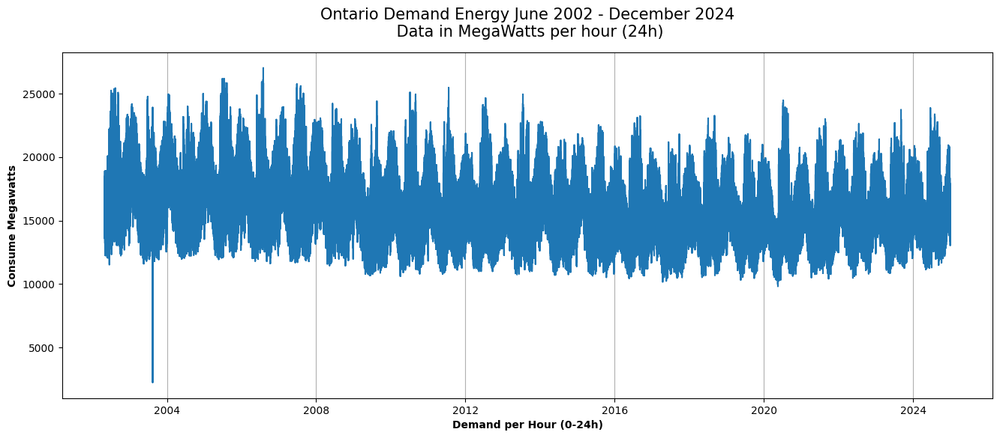

In [26]:
# Vizualize Data
chart_size = (16, 6)
fig, xy = plt.subplots(figsize=chart_size)
# az.plot(series[169000:169200], marker="+")
#xy.plot(data['Ontario Demand'].values)
xy.plot(data.index, data['Ontario Demand'])
xy.grid(axis = 'x')
plt.title("Ontario Demand Energy June 2002 - December 2024\n Data in MegaWatts per hour (24h)",fontsize=15, pad=15)
plt.xlabel('Demand per Hour (0-24h)', fontweight='bold')
plt.ylabel('Consume Megawatts', fontweight='bold')

fig.savefig("pics\\energy_1.png", dpi=300)

plt.show()

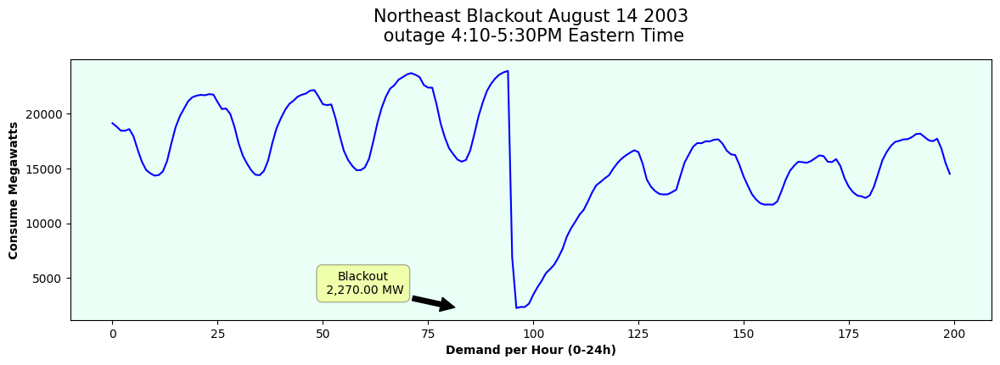

In [8]:
# Vizualize Data lowest outlier
size = (14, 4)
fig, z = plt.subplots(figsize=size)
z.plot(data['Ontario Demand'][11200:11400].values, color="blue")

# Find the index and value of minimum demand
demand_slice = data['Ontario Demand'][11200:11400]
min_demand = demand_slice.min()

wh = []
for i in range(len(data['Ontario Demand'][11200:11400])):
    wh.append(i)
ndt = pd.DataFrame()
ndt['MW'] = data['Ontario Demand'][11200:11400]
ndt['P']= wh

# Add annotation (Arrow) at the minimum point
z.annotate(f"Blackout\n {ndt['MW'].min():,.2f} MW",
           xy=(ndt['P'].iloc[82], min_demand),  # Tuple of (x, y) coordinates
           xytext=(-80, 10),              # Offset in points
           textcoords="offset points",
           ha='center',
           arrowprops=dict(facecolor='black', shrink=0.05),horizontalalignment='right', verticalalignment='bottom',  # Optional arrow
           bbox=dict(boxstyle="round,pad=0.5", fc="yellow", alpha=0.3))  # Optional box
z.set_facecolor('#eafff5')
plt.title("Northeast Blackout August 14 2003\n outage 4:10-5:30PM Eastern Time",fontsize=15, pad=15)
plt.xlabel('Demand per Hour (0-24h)', fontweight='bold')
plt.ylabel('Consume Megawatts', fontweight='bold')
plt.show()

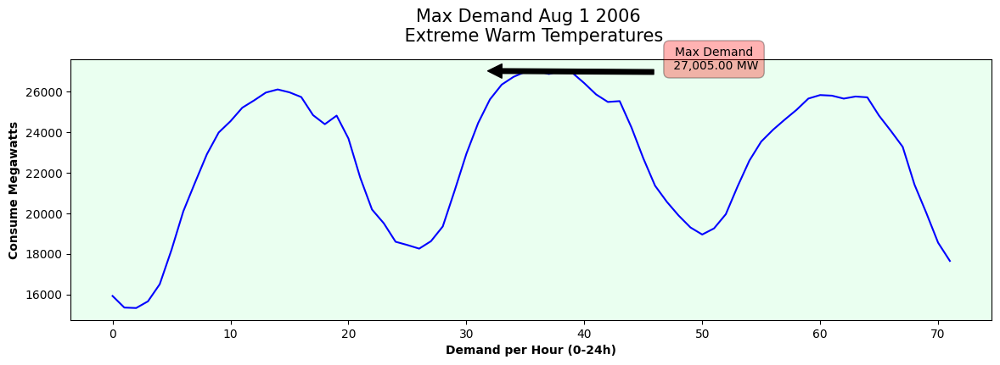

In [9]:
# Vizualize Data Max Peak outlier
size = (14, 4)
fig, z = plt.subplots(figsize=size)
z.plot(data['Ontario Demand'][37249:37321].values, color="blue")

# Find the index and value of minimum demand
demand_slice = data['Ontario Demand'][37249:37321]
max_demand = demand_slice.max()

md = []
for i in range(len(data['Ontario Demand'][37249:37321])):
    md.append(i)
maxdt = pd.DataFrame()
maxdt['MW'] = data['Ontario Demand'][37249:37321]
maxdt['P']= md

# Add annotation (Arrow) at the minimum point
z.annotate(f"Max Demand\n {maxdt['MW'].max():,.2f} MW",
           xy=(maxdt['P'].iloc[31], max_demand),  # Tuple of (x, y) coordinates
           xytext=(200, -1),              # Offset in points
           textcoords="offset points",
           ha='center',
           arrowprops=dict(facecolor='black', shrink=0.05),horizontalalignment='right', verticalalignment='bottom',  # Optional arrow
           bbox=dict(boxstyle="round,pad=0.5", fc="red", alpha=0.3))  # Optional box
z.set_facecolor('#eafff0')
plt.title("Max Demand Aug 1 2006 \n Extreme Warm Temperatures",fontsize=15, pad=15)
plt.xlabel('Demand per Hour (0-24h)', fontweight='bold')
plt.ylabel('Consume Megawatts', fontweight='bold')
plt.show()

In [10]:
import plotly.express as px

# Create the box plot with more customization
fig = px.box(data.iloc[11281:11400], x="Hour", y="Ontario Demand",
    title="Northeast Blackout of 2003 - August 14 \nOutage 4:10-5:30PM Eastern Time",  # Added title
    points="outliers",  # Show outlier points
    color="Hour",       # Add color variation by hour
    notched=True,       # Add notched boxes to show confidence intervals
    template="plotly_white"  # Set a clean template
)

# Update traces
fig.update_traces(quartilemethod="exclusive",  # Keep your quartile method
    jitter=0.3,                  # Add jitter to see point distribution
    marker=dict(size=3)          # Customize marker size
)

# Update layout with additional features
fig.update_layout(xaxis_title="Hour of Day", # Customize x-axis label
    yaxis_title="Demand (MW)",             # Customize y-axis label
    showlegend=True,                       # Ensure legend is visible
    legend_title_text="Hour",
    legend = dict(bgcolor = 'yellow'),              # Add legend title
    font=dict(family="Arial", size=12),    # Customize font
    title_x=0.5,                          # Center the title
    bargap=0.2,                           # Adjust gap between boxes
    width=1000,                           # Set figure width
    height=600                            # Set figure height
)
#fig.update_layout({
#'plot_bgcolor': 'rgba(0, 0, 0, 0)',
#'paper_bgcolor': 'rgba(0, 0, 0, 0)',
#})
# To add annotations
fig.add_annotation(x=15, y=data["Ontario Demand"].max(),text="Peak Demand Hour",showarrow=True,arrowhead=2)
fig.add_annotation(x=17, y=data["Ontario Demand"].min(),text="Blackout",showarrow=True,arrowhead=2)

# To add a horizontal line (e.g., mean demand)
fig.add_hline(y=data["Ontario Demand"].mean(),line_dash="dash",line_color="red",annotation_text="Mean Demand")
# Add gridlines for better readability
fig.update_yaxes(showgrid=True)
fig.update_xaxes(showgrid=True)

fig.show()

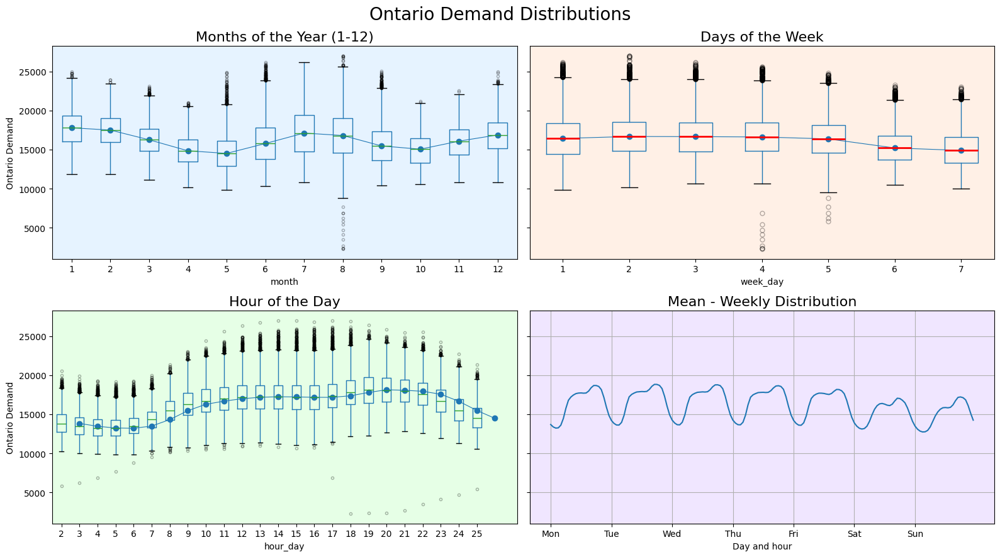

In [32]:
# Annual, weekly and daily seasonality
fig, axs = plt.subplots(2, 2, figsize=(16, 9), sharex=False, sharey=True)
axs = axs.ravel()

# Demand distribution by month
data['month'] = data.index.month
data.boxplot(column='Ontario Demand', by='month', ax=axs[0], flierprops={'markersize': 3, 'alpha': 0.3})
data.groupby('month')['Ontario Demand'].median().plot(style='o-', linewidth=0.8, ax=axs[0])
axs[0].set_ylabel('Ontario Demand')
axs[0].set_title('Months of the Year (1-12)', fontsize=16)
axs[0].set_facecolor('#e6f3ff')

# Days of the week
data['week_day'] = data.index.day_of_week + 1
data.boxplot(column='Ontario Demand', by='week_day', ax=axs[1], medianprops={"color": "red", "linewidth": 2.0},flierprops={'markersize': 5, 'alpha': 0.3})
data.groupby('week_day')['Ontario Demand'].median().plot(style='o-', linewidth=0.8, ax=axs[1])
axs[1].set_ylabel('Ontario Demand')
axs[1].set_title('Days of the Week', fontsize=16)
axs[1].set_facecolor('#fff0e6')

# Demand distribution by the hour of the day
data['hour_day'] = data['Hour'].values + 1
data.boxplot(column='Ontario Demand', by='hour_day', ax=axs[2], flierprops={'markersize': 3, 'alpha': 0.3})
data.groupby('hour_day')['Ontario Demand'].median().plot(style='o-', linewidth=0.8, ax=axs[2])
axs[2].set_ylabel('Ontario Demand')
axs[2].set_title('Hour of the Day', fontsize=16)
axs[2].set_facecolor('#e6ffe6')

# Demand distribution by week day and hour of the day
mean_day_hour = data.groupby(["week_day", "hour_day"])["Ontario Demand"].mean()
mean_day_hour.plot(ax=axs[3])
axs[3].set(
    title      = "Mean - Weekly Distribution",
    xticks     = [i * 24 for i in range(7)],
    xticklabels= ["Mon", "Tue", "Wed", "Thu", "Fri", "Sat", "Sun"],
    xlabel     = "Day and hour",
    ylabel     = "Number of Demand"
)
axs[3].title.set_size(16)
axs[3].grid()
axs[3].set_facecolor('#f0e6ff')

fig.suptitle("Ontario Demand Distributions", fontsize=20)
fig.tight_layout()

fig=plt.gcf()
fig.savefig("pics\\energy_4.png", dpi=300)

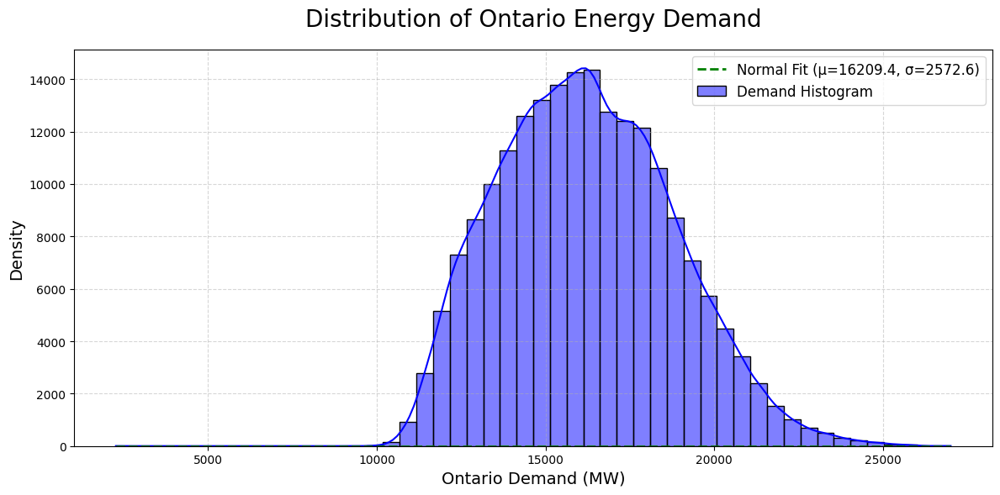

In [12]:
plt.figure(figsize=(12, 6))

# Plot histogram with KDE
ax = sns.histplot(data=data['Ontario Demand'],bins=50,color='blue',edgecolor='black',kde=True, label='Demand Histogram')

# Add normal fit curve
mu, sigma = norm.fit(data['Ontario Demand'].dropna())
x = np.linspace(min(data['Ontario Demand']), max(data['Ontario Demand']), 100)
norm_fit = norm.pdf(x, mu, sigma)
ax.plot(x, norm_fit, 'g--', lw=2, label=f'Normal Fit (μ={mu:.1f}, σ={sigma:.1f})')

# Customize
ax.set_title('Distribution of Ontario Energy Demand', fontsize=20, pad=20)
ax.set_xlabel('Ontario Demand (MW)', fontsize=14)
ax.set_ylabel('Density', fontsize=14)
ax.legend(fontsize=12)
ax.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

In [13]:
mw = data['Ontario Demand']
mean = mw.mean()          # Mean
variance = mw.var()
std_dev = mw.std()        # Standard deviation
skewness = mw.skew()      # Skewness (Pandas method)
kurtosis = mw.kurtosis()

table1 = [['Moments','Values'],
['Mean', "{:.2f}".format(mean)],
['Variance', "{:.2f}".format(variance)],
['Standard Dev.', "{:.2f}".format(std_dev)],
['Skewness', "{:.2f}".format(skewness)],
['Kurtosis', "{:.2f}".format(kurtosis)]]

print(tabulate(table1, headers='firstrow', tablefmt='fancy_grid'))
data['Ontario Demand'].describe()

╒═══════════════╤═════════════════╕
│ Moments       │          Values │
╞═══════════════╪═════════════════╡
│ Mean          │ 16209.4         │
├───────────────┼─────────────────┤
│ Variance      │     6.61822e+06 │
├───────────────┼─────────────────┤
│ Standard Dev. │  2572.59        │
├───────────────┼─────────────────┤
│ Skewness      │     0.3         │
├───────────────┼─────────────────┤
│ Kurtosis      │    -0.26        │
╘═══════════════╧═════════════════╛


count    198744.000000
mean      16209.365817
std        2572.589832
min        2270.000000
25%       14280.000000
50%       16093.000000
75%       17986.000000
max       27005.000000
Name: Ontario Demand, dtype: float64

In [14]:
print('Skewness',f'{skewness:.2f}', "Mildly right-skewed, with a tendency toward occasional higher consumption values.")
print('Kurtosis',f'{kurtosis:.2f}', "Platykurtic, meaning a flatter peak and thinner tails compared to a normal distribution.")
print(f"Highest Demand in the last 23 years {data['Ontario Demand'].max():,.2f} Megawatts Aug/1/2006 Heatwave Temperatues reaching 36C and feeling 47C")
print(f"Lowest Deman in the last 23 years {data['Ontario Demand'].min():,.2f} Megawatts Northeast Blackout of 2003")

Skewness 0.30 Mildly right-skewed, with a tendency toward occasional higher consumption values.
Kurtosis -0.26 Platykurtic, meaning a flatter peak and thinner tails compared to a normal distribution.
Highest Demand in the last 23 years 27,005.00 Megawatts Aug/1/2006 Heatwave Temperatues reaching 36C and feeling 47C
Lowest Deman in the last 23 years 2,270.00 Megawatts Northeast Blackout of 2003


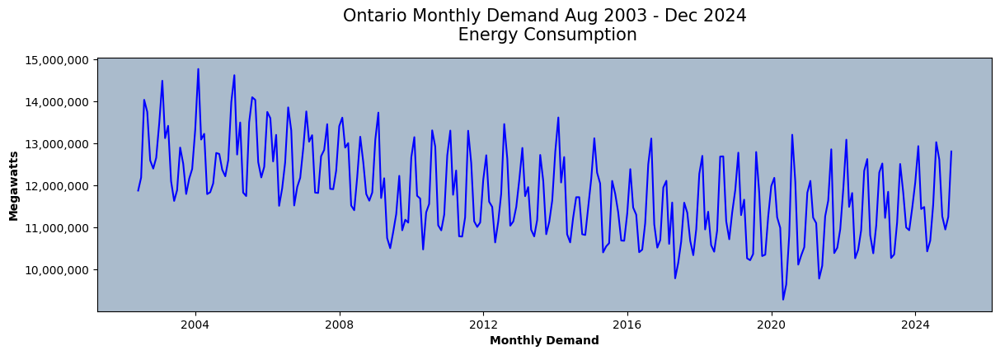

In [15]:
# Convert the hourly data to monthly data and then decompose the Time-Series
data2 = data.drop(['Hour', 'month','week_day','hour_day'], axis=1)
monthly_tot = data2['Ontario Demand'].resample('ME').sum()
# Monthly average
monthly_avg = data2['Ontario Demand'].resample('ME').mean()

# Vizualize Monthly Data
size = (14, 4)
fig, z = plt.subplots(figsize=size)
z.plot(monthly_tot, color="blue")
z.set_facecolor('#aabbcc')
plt.title("Ontario Monthly Demand Aug 2003 - Dec 2024\n Energy Consumption",fontsize=15, pad=15)
plt.xlabel('Monthly Demand', fontweight='bold')
plt.ylabel('Megawatts', fontweight='bold')
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plt.show()

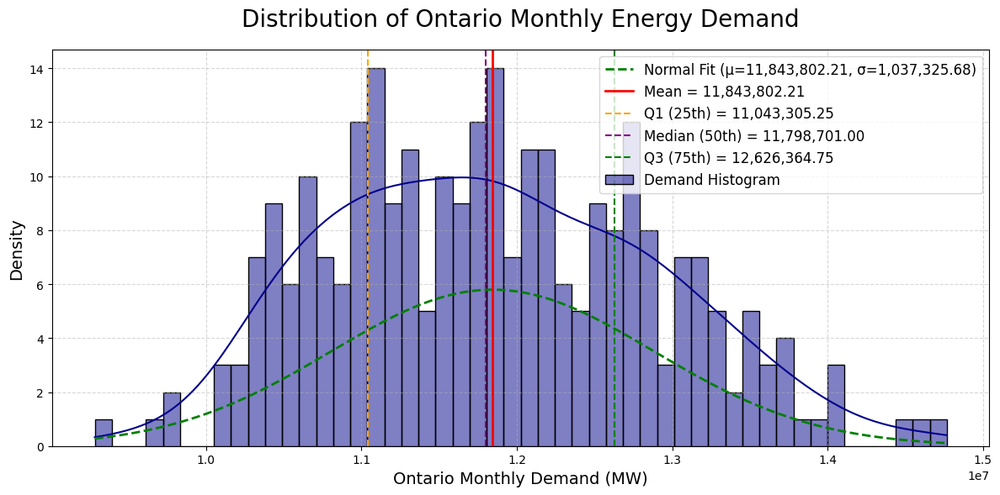

In [27]:
# Distribution for Monthly Data
plt.figure(figsize=(12, 6))

# Plot histogram with KDE
ax = sns.histplot(data=monthly_tot,bins=50,color='darkblue',edgecolor='black',kde=True, label='Demand Histogram')

# Add normal fit curve
mu, sigma = norm.fit(monthly_tot.dropna())
x = np.linspace(min(monthly_tot), max(monthly_tot), 100)
norm_fit = norm.pdf(x, mu, sigma)*len(monthly_tot.dropna())*(x[1]-x[0])
ax.plot(x, norm_fit, 'g--', lw=2, label=f'Normal Fit (μ={mu:,.2f}, σ={sigma:,.2f})')

# add mean
mean_vert = monthly_tot.mean()
ax.axvline(mean_vert, color='red', linestyle='-', lw=2, label=f'Mean = {mean_vert:,.2f}')

# add quantiles (25th, 50th, 75th) as vertival lines
quantiles_month = monthly_tot.quantile([0.25,0.5,0.75])
colors = ['orange','purple','green']
labels = ['Q1 (25th)', 'Median (50th)', 'Q3 (75th)']
for q, color, label in zip(quantiles_month, colors, labels):
    ax.axvline(q,color=color, linestyle='--', lw=1.5, label=f'{label} = {q:,.2f}')

# title, axis label, legend ... style
ax.set_title('Distribution of Ontario Monthly Energy Demand', fontsize=20, pad=20)
ax.set_xlabel('Ontario Monthly Demand (MW)', fontsize=14)
ax.set_ylabel('Density', fontsize=14)
ax.legend(fontsize=12)
ax.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
fig=plt.gcf()
fig.savefig("pics\\energy_3.png", dpi=300)


plt.show()

In [17]:
mw_monthly = monthly_tot

stats_monthly = {'mean':f'{mw_monthly.mean():,.2f}', 'variance':f'{mw_monthly.var():,.2f}',
                 'std_dev':f'{mw_monthly.std():,.2f}', 'skewness':f'{mw_monthly.skew():,.2f}',
                 'kurtosis':f'{mw_monthly.kurtosis():,.2f}'}

table_month = [['Monthly - Stat Moments','Values (MegaWatts)'],
['Mean', stats_monthly['mean']],
['Variance', stats_monthly['variance']],
['Standard Dev.', stats_monthly['std_dev']],
['Skewness', stats_monthly['skewness']],
['Kurtosis', stats_monthly['kurtosis']]]

print(tabulate(table_month, headers='firstrow', tablefmt='fancy_grid'))

""" Skewness measure trhe asymetry of the data, zero values means normal distribution, positive values indicate skewed to the right and negative to left.
    Kurtosis represent the peakness, zero mean normal, higher than zero means sharper peaks and below means lighter tails, but flat """

print('Skewness =',stats_monthly['skewness'], "Mildly right-skewed, with a tendency toward occasional higher consumption values.")
print('Kurtosis =',stats_monthly['kurtosis'], "Platykurtic, meaning a flatter peak and thinner tails compared to a normal distribution.")
print("Highest Monthly Demand in the last 23 years = ",f'{monthly_tot.max():,.2f}', "MegaWatts", "Jan/2004")
print("Lowest Deman in the last 23 years = ",f'{monthly_tot.min():,.2f}', "MegaWatts", "April/2020")

╒══════════════════════════╤══════════════════════╕
│ Monthly - Stat Moments   │ Values (MegaWatts)   │
╞══════════════════════════╪══════════════════════╡
│ Mean                     │ 11,843,802.21        │
├──────────────────────────┼──────────────────────┤
│ Variance                 │ 1,080,015,218,657.26 │
├──────────────────────────┼──────────────────────┤
│ Standard Dev.            │ 1,039,237.81         │
├──────────────────────────┼──────────────────────┤
│ Skewness                 │ 0.26                 │
├──────────────────────────┼──────────────────────┤
│ Kurtosis                 │ -0.46                │
╘══════════════════════════╧══════════════════════╛
Skewness = 0.26 Mildly right-skewed, with a tendency toward occasional higher consumption values.
Kurtosis = -0.46 Platykurtic, meaning a flatter peak and thinner tails compared to a normal distribution.
Highest Monthly Demand in the last 23 years =  14,767,506.00 MegaWatts Jan/2004
Lowest Deman in the last 23 years =  9,2

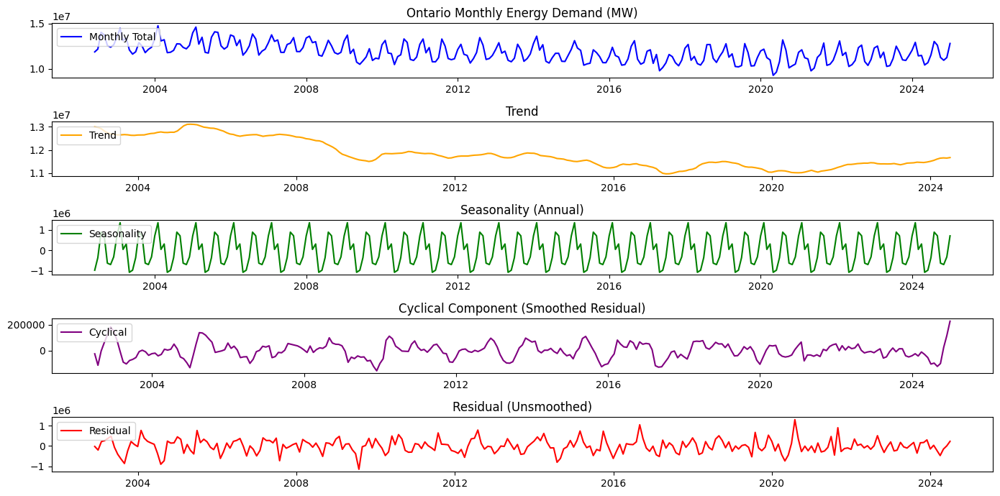

In [33]:
# Decompose the Time Series (Trend, Seasonality, Cyclical and Residual)
# Yearly seasonality period=12 (12 months - 1 year)
decomposition = seasonal_decompose(monthly_tot, model='additive', period=12)

# Components
original = monthly_tot
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid
cyclical = residual.rolling(window=12, center=True, min_periods=1).mean()

# Step 4: Plot the Components
plt.figure(figsize=(14, 7)) #, facecolor='yellow')

# Original Monthly Data
plt.subplot(5, 1, 1)
plt.plot(original, label='Monthly Total', color='blue')
plt.title('Ontario Monthly Energy Demand (MW)')
plt.legend(loc='upper left')

# Trend
plt.subplot(5, 1, 2)
plt.plot(trend, label='Trend', color='orange')
plt.title('Trend')
plt.legend(loc='upper left')

# Seasonality
plt.subplot(5, 1, 3)
plt.plot(seasonal, label='Seasonality', color='green')
plt.title('Seasonality (Annual)')
plt.legend(loc='upper left')

# Cyclical
plt.subplot(5, 1, 4)
plt.plot(cyclical, label='Cyclical', color='purple')
plt.title('Cyclical Component (Smoothed Residual)')
plt.legend(loc='upper left')

# Residual
plt.subplot(5, 1, 5)
plt.plot(residual, label='Residual', color='red')
plt.title('Residual (Unsmoothed)')
plt.legend(loc='upper left')

plt.tight_layout()
fig=plt.gcf()
fig.savefig("pics\\energy_7.png", dpi=300)
plt.show()

In [39]:
# Check for Stationary / Non-Stationary (Dickey-Fuller)
split = len(monthly_tot) // 2
first_half = monthly_tot[:split]
second_half = monthly_tot[split:]

print(f'Mean of first half: {first_half.mean():,.2f}')
print(f'Mean of second half: {second_half.mean():,.2f}')
print(f'Variance of first half: {first_half.var():,.2f}')
print(f'Variance of second half: {second_half.var():,.2f}')

Mean of first half: 12,319,660.41
Mean of second half: 11,367,944.00
Variance of first half: 916,300,070,781.71
Variance of second half: 795,493,733,095.33


In [40]:
# The null hypothesis 𝐻0 is that the data is non-stationary. If we reject 𝐻0, the data is stationary
# call ADF library and check results
result = adfuller(monthly_tot)
table_ADF = [['Dickey-Fuller','Critical Values'],
['ADF Statistic', round(result[0],2)],
['p-value', round(result[1],2)],
['1%', round(result[4]['1%'],2)],
['5%', round(result[4]['5%'],2)],
['10%', round(result[4]['10%'],2)]]

print(tabulate(table_ADF, headers='firstrow', tablefmt='fancy_grid'))

╒═════════════════╤═══════════════════╕
│ Dickey-Fuller   │   Critical Values │
╞═════════════════╪═══════════════════╡
│ ADF Statistic   │             -1.36 │
├─────────────────┼───────────────────┤
│ p-value         │              0.6  │
├─────────────────┼───────────────────┤
│ 1%              │             -3.46 │
├─────────────────┼───────────────────┤
│ 5%              │             -2.87 │
├─────────────────┼───────────────────┤
│ 10%             │             -2.57 │
╘═════════════════╧═══════════════════╛


Hypothesis 𝐻0 is that the data is non-stationary

Results ADF = -1.36 is relatively small in magnitude, likely suggesting weak evidence agianst non-stationary. However, it may fails to reject the null hypothesis (Data is Non-stationary).

p-value = 0.6 -> Probabbility of observing the Test Statistic under the nul hiphothesys. It Fails to reject the null hypothesis of non-stationarity.

 ADF Critical Values:
- 1% critical value: -3.43
- 5% critical value: -2.86
- 10% critical value: -2.57

+ 1% = -3.46: Reject the null hyphothesys at 99% confidence level
+ 5% = -2.87: Reject the null hyphothesys at 95% confidence level
+ 10% = -2.57 : Reject the null hyphothesys at 90% confidence level

Final conclusion: Since the ADF coeficient -1.36 is greater than any critical value this fails to reject the null hyphothesys and any significant levels. The Data is non-tationary, meaning its statistical properties (mean, variance, autocorrelation) are not constant over time. The data contains a unit root, indicating a trend or stochastic process.

In [23]:
# First difference
test2 = monthly_tot.diff().dropna()
result_diff = adfuller(test2)
print('ADF Statistic (differenced):', result_diff[0])
print('p-value (differenced):', result_diff[1])

ADF Statistic (differenced): -6.228016407388483
p-value (differenced): 5.03289782204116e-08


After applying the first difference to the monthly total data, the ADF test yields a statistic of -6.23 and a p-value close to zero (5.03x10^-8).
This is far below the 1% critical value of -3.46, allowing us to reject the null hypothesis of a unit root with high confidence.
The differenced data is stationary, indicating that the original series was non-stationary due to a trend, which was successfully removed by differencing.
This makes the data suitable for time series modeling that assumes stationarity.

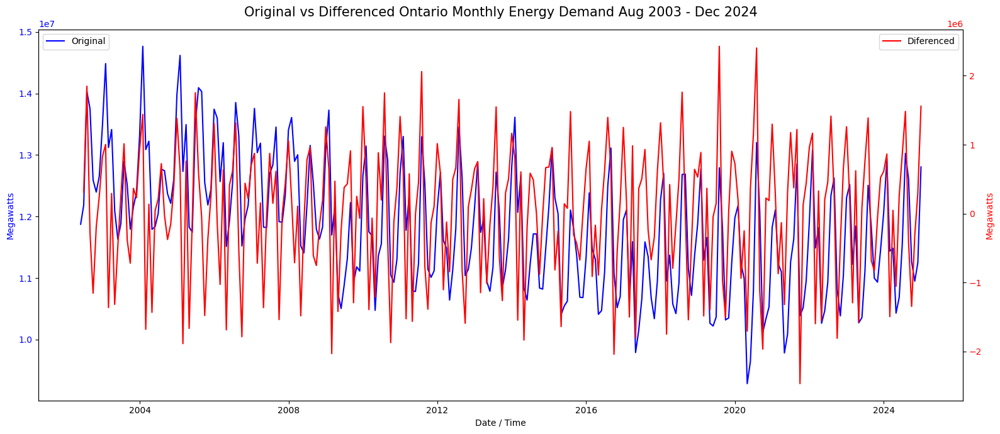

In [45]:
# Create the plot
fig, ax1 = plt.subplots(figsize=(16,7))

# Plot first dataset on primary y-axis (left)
ax1.plot(monthly_tot, 'b-', label='Original')
ax1.set_xlabel('Date / Time')
ax1.set_ylabel('Megawatts', color='b')
ax1.tick_params(axis='y', labelcolor='b')

# Create second y-axis sharing the same x-axis
ax2 = ax1.twinx()

# Plot second dataset on secondary y-axis (right)
ax2.plot(test2, 'r-', label='Diferenced')
ax2.set_ylabel('Megawatts', color='r')
ax2.tick_params(axis='y', labelcolor='r')

# Add titles and adjust layout
plt.title("Original vs Differenced Ontario Monthly Energy Demand Aug 2003 - Dec 2024",fontsize=15, pad=15)
fig.tight_layout()

# Add legends
ax1.legend(loc='upper left')
ax2.legend(loc='upper right')

# Display the plot
plt.show()

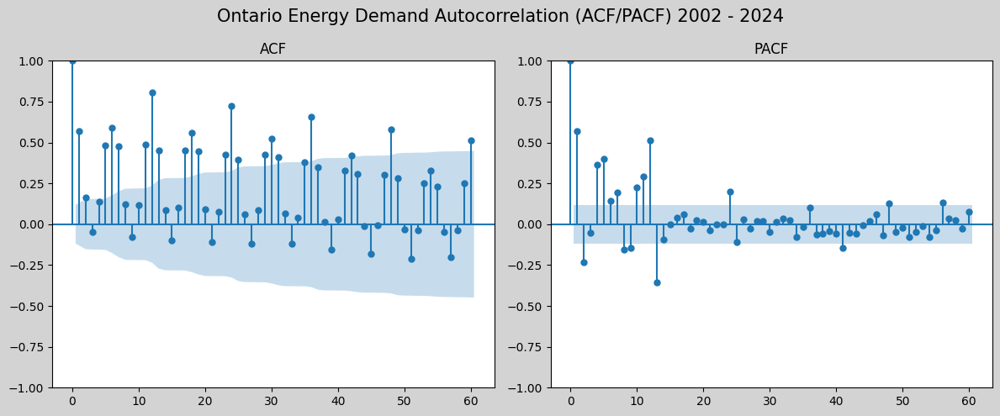

In [34]:
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

# Plot ACF
fig = plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plot_acf(monthly_tot, lags=12*5, ax=plt.gca())
plt.title('ACF')

# Plot PACF
plt.subplot(1, 2, 2)
plot_pacf(monthly_tot, lags=12*5, ax=plt.gca())
plt.title('PACF')

fig.suptitle("Ontario Energy Demand Autocorrelation (ACF/PACF) 2002 - 2024", fontsize=15)
fig.tight_layout()
fig.set_facecolor('lightgray')

fig=plt.gcf()
fig.savefig("pics\\energy_8.png", dpi=300)
plt.show()

ACF
 - Lag 0: Autocorrelation is 1.0 (as expected).
 - Lags 1–10: Significant positive autocorrelations, with peaks around lags 1, 2, and 7–10, extending beyond the confidence interval (shaded area).
 - Lags 11–60: A slow, sinusoidal decay with alternating positive and negative values, remaining significant at several lags (e.g., around 20, 30, 40).

PACF
 - Lag 0: Partial autocorrelation is 1.0.
 - Lag 1: A significant spike (close to 1.0), indicating a strong autoregressive component.
 - Lags 2–5: Smaller but significant spikes.
 - Lags 6 onward: Drops to near zero and fluctuates within the confidence interval.

Quantiles:
0.05    10345803.00
0.25    11043305.25
0.50    11798701.00
0.75    12626364.75
0.95    13602759.70
Name: Ontario Demand, dtype: float64


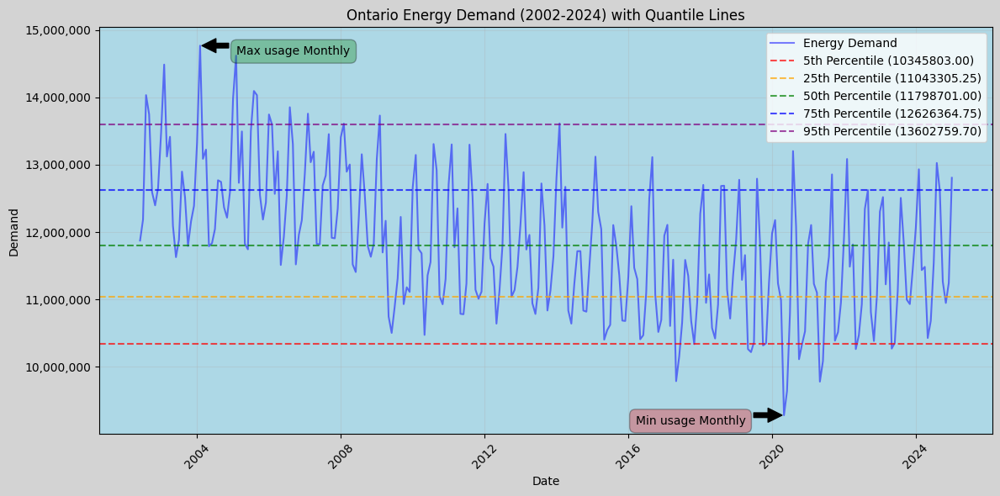

In [30]:
# quantiles
quantiles = monthly_tot.quantile([0.05, 0.25, 0.50, 0.75, 0.95])
print("Quantiles:")
print(quantiles)

# add color to quantiles to identiy each one
quantile_colors = {0.05: 'red', 0.25: 'orange', 0.50: 'green', 0.75: 'blue', 0.95: 'purple'}

# Time Series Plot with Quantile Lines
plt.figure(figsize=(12, 6),facecolor='lightgray')
plt.plot(monthly_tot.index, monthly_tot, label='Energy Demand', color='blue', alpha=0.5)

# Loop to indentify quantiles and set lines through plot
for q, value in quantiles.items():
    plt.axhline(y=value, color=quantile_colors[q], linestyle='--', alpha=0.7, label=f'{int(q*100)}th Percentile ({value:.2f})')

plt.annotate('Max usage Monthly',xy=(monthly_tot.idxmax(), monthly_tot.max()), xytext=(80, -10), textcoords="offset points",
           ha='center', arrowprops=dict(facecolor='black', shrink=0.05),horizontalalignment='right', verticalalignment='bottom',
           bbox=dict(boxstyle="round,pad=0.5", fc="green", alpha=0.3))
plt.annotate('Min usage Monthly',xy=(monthly_tot.idxmin(), monthly_tot.min()), xytext=(-80, -10), textcoords="offset points",
           ha='center', arrowprops=dict(facecolor='black', shrink=0.05),horizontalalignment='right', verticalalignment='bottom',
           bbox=dict(boxstyle="round,pad=0.5", fc="red", alpha=0.3))
asx = plt.gca()
asx.set_facecolor('lightblue')
plt.title('Ontario Energy Demand (2002-2024) with Quantile Lines')
plt.xlabel('Date')
plt.ylabel('Demand')
plt.legend()
plt.grid(True, alpha=0.3)
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plt.xticks(rotation=45)
plt.tight_layout()

fig=plt.gcf()
fig.savefig("pics\\energy_5.png", dpi=300)
plt.show()

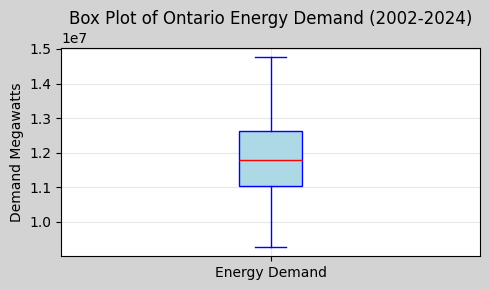

In [27]:
plt.figure(figsize=(5, 3),facecolor='lightgray')
plt.boxplot(monthly_tot, vert=True, patch_artist=True, boxprops=dict(facecolor='lightblue', color='blue'),medianprops=dict(color='red'),
            whiskerprops=dict(color='blue'), capprops=dict(color='blue'),flierprops=dict(color='gray', markeredgecolor='gray'))

plt.title('Box Plot of Ontario Energy Demand (2002-2024)')
plt.ylabel('Demand Megawatts')
plt.xticks([1], ['Energy Demand'])  # Single box plot
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

Quantiles Yearly:
0.05    1.323064e+08
0.25    1.370415e+08
0.50    1.401105e+08
0.75    1.470556e+08
0.95    1.533754e+08
Name: Ontario Demand, dtype: float64


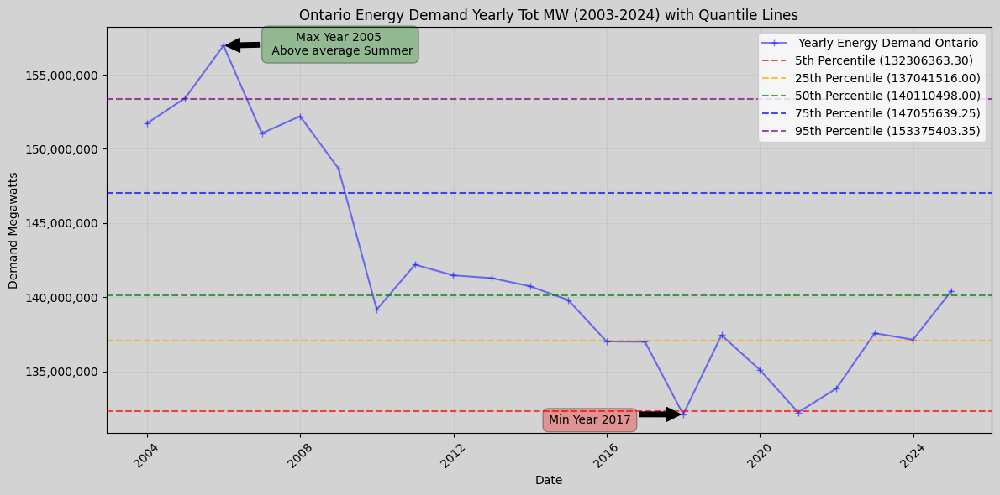

In [31]:
# yearly_tot = data2['Ontario Demand'].resample('Y').sum()
yearly_tot = data2['Ontario Demand'].resample('YE').sum()
# Drop first year 2002 because dat ais imcplete
yearly = yearly_tot.iloc[1:,]

# quantiles - Year
quantiles_y = yearly.quantile([0.05, 0.25, 0.50, 0.75, 0.95])
print("Quantiles Yearly:")
print(quantiles_y)

# add color to quantiles to identiy each one
quantile_colors_y = {0.05: 'red', 0.25: 'orange', 0.50: 'green', 0.75: 'blue', 0.95: 'purple'}

# Time Series Plot with Quantile Lines
plt.figure(figsize=(12, 6),facecolor='lightgray')
plt.plot(yearly.index, yearly, marker="+",label=' Yearly Energy Demand Ontario', color='blue', alpha=0.5)

# Loop to indentify quantiles and set lines through plot
for q, value in quantiles_y.items():
    plt.axhline(y=value, color=quantile_colors_y[q], linestyle='--', alpha=0.7, label=f'{int(q*100)}th Percentile ({value:.2f})')

plt.annotate('Max Year 2005 \n Above average Summer',xy=(yearly.idxmax(), yearly.max()), xytext=(100, -10), textcoords="offset points",
           ha='center', arrowprops=dict(facecolor='black', shrink=0.05),horizontalalignment='right', verticalalignment='bottom',
           bbox=dict(boxstyle="round,pad=0.5", fc="green", alpha=0.3))
plt.annotate('Min Year 2017',xy=(yearly.idxmin(), yearly.min()), xytext=(-80, -10), textcoords="offset points",
           ha='center', arrowprops=dict(facecolor='black', shrink=0.05),horizontalalignment='right', verticalalignment='bottom',
           bbox=dict(boxstyle="round,pad=0.5", fc="red", alpha=0.3))
asx = plt.gca()
asx.set_facecolor('lightgray')
plt.title('Ontario Energy Demand Yearly Tot MW (2003-2024) with Quantile Lines')
plt.xlabel('Date')
plt.ylabel('Demand Megawatts')
plt.legend()
plt.grid(True, alpha=0.3)
# avoid scientific notation
plt.ticklabel_format(style='plain', axis='y')
# updating format for million
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plt.xticks(rotation=45)
plt.tight_layout()

fig=plt.gcf()
fig.savefig("pics\\energy_6.png", dpi=300)
plt.show()

In [43]:
""" May require further reaserch if is necessary to differentiate the data that could generate
   in theory a focus to changes in the data. It would torn the non-stationary data to a stationary data
   differenced data to focus on changes >>> diff = monthly_tot.diff().dropna() """

# Define confidence levels for VaR (Value-at-Risk) and ES (Expected Shortfall)
confidence_levels = [0.90, 0.95, 0.99]  # 90%, 95%, 99%

# Function to calculate VaR and ES
def calculate_var_es(data, confidence_level):
    # VaR: Quantile at (1 - confidence_level)
    var = np.percentile(data, 100 * (1 - confidence_level))
    # ES: Average of values beyond VaR
    es = data[data <= var].mean() if confidence_level > 0.5 else data[data >= var].mean()
    return var, es

print("Tail Risk Metrics for Raw Energy Demand (Upper Tail):")

upper_tail_results = {}
for cl in confidence_levels:
    var, es = calculate_var_es(monthly_tot, 1 - cl)  # Upper tail
    upper_tail_results[cl] = (var, es)

table_Risk_Up = [['Confidence Level','Value-at-Risk (MW)','Expected Shortfall (MW)'],
['90.0%', "{:,.2f}".format(upper_tail_results[0.9][0]),"{:,.2f}".format(upper_tail_results[0.9][1])],
[' 95.0%', "{:,.2f}".format(upper_tail_results[0.95][0]),"{:,.2f}".format(upper_tail_results[0.95][1])],
['99.0%', "{:,.2f}".format(upper_tail_results[0.99][0]),"{:,.2f}".format(upper_tail_results[0.99][1])]]

print(tabulate(table_Risk_Up, headers='firstrow', tablefmt='fancy_grid'))

Tail Risk Metrics for Raw Energy Demand (Upper Tail):
╒════════════════════╤══════════════════════╤═══════════════════════════╕
│ Confidence Level   │ Value-at-Risk (MW)   │ Expected Shortfall (MW)   │
╞════════════════════╪══════════════════════╪═══════════════════════════╡
│ 90.0%              │ 13,222,515.00        │ 13,701,829.79             │
├────────────────────┼──────────────────────┼───────────────────────────┤
│ 95.0%              │ 13,602,759.70        │ 14,005,438.29             │
├────────────────────┼──────────────────────┼───────────────────────────┤
│ 99.0%              │ 14,208,444.17        │ 14,624,524.00             │
╘════════════════════╧══════════════════════╧═══════════════════════════╛


In [44]:
print("\nTail Risk Metrics for Ontario Energy Demand 2002 - 2024 (Peaks and Troughs):")
lower_tail_results = {}
upper_tail_diff_results = {}
for cl in confidence_levels:
    # Lower tail (negative changes)
    var_lower, es_lower = calculate_var_es(monthly_tot, cl)  # Lower tail
    lower_tail_results[cl] = (var_lower, es_lower)
    # Upper tail (positive changes)
    var_upper, es_upper = calculate_var_es(monthly_tot, 1 - cl)  # Upper tail
    upper_tail_diff_results[cl] = (var_upper, es_upper)

table_Risk_Down = [['Confidence Level','Drop in Demand (VaR - MW)','Drop in Demand (ES - MW)', 'Peak in Demand (VaR - MW)','Peak in Demand (ES - MW)'],
['90.0%', "{:,.2f}".format(lower_tail_results[0.9][0]),"{:,.2f}".format(lower_tail_results[0.9][1]),
 "{:,.2f}".format(upper_tail_diff_results[0.9][0]),"{:,.2f}".format(upper_tail_diff_results[0.9][1])],
[' 95.0%', "{:,.2f}".format(lower_tail_results[0.95][0]),"{:,.2f}".format(lower_tail_results[0.95][1]),
 "{:,.2f}".format(upper_tail_diff_results[0.95][0]),"{:,.2f}".format(upper_tail_diff_results[0.95][1])],
['99.0%', "{:,.2f}".format(lower_tail_results[0.99][0]),"{:,.2f}".format(lower_tail_results[0.99][1]),
 "{:,.2f}".format(upper_tail_diff_results[0.99][0]),"{:,.2f}".format(upper_tail_diff_results[0.99][1])]]

print(tabulate(table_Risk_Down, headers='firstrow', tablefmt='fancy_grid'))


Tail Risk Metrics for Ontario Energy Demand 2002 - 2024 (Peaks and Troughs):
╒════════════════════╤═════════════════════════════╤════════════════════════════╤═════════════════════════════╤════════════════════════════╕
│ Confidence Level   │ Drop in Demand (VaR - MW)   │ Drop in Demand (ES - MW)   │ Peak in Demand (VaR - MW)   │ Peak in Demand (ES - MW)   │
╞════════════════════╪═════════════════════════════╪════════════════════════════╪═════════════════════════════╪════════════════════════════╡
│ 90.0%              │ 10,516,393.70               │ 10,243,405.04              │ 13,222,515.00               │ 13,701,829.79              │
├────────────────────┼─────────────────────────────┼────────────────────────────┼─────────────────────────────┼────────────────────────────┤
│ 95.0%              │ 10,345,803.00               │ 10,061,932.00              │ 13,602,759.70               │ 14,005,438.29              │
├────────────────────┼─────────────────────────────┼────────────────────────

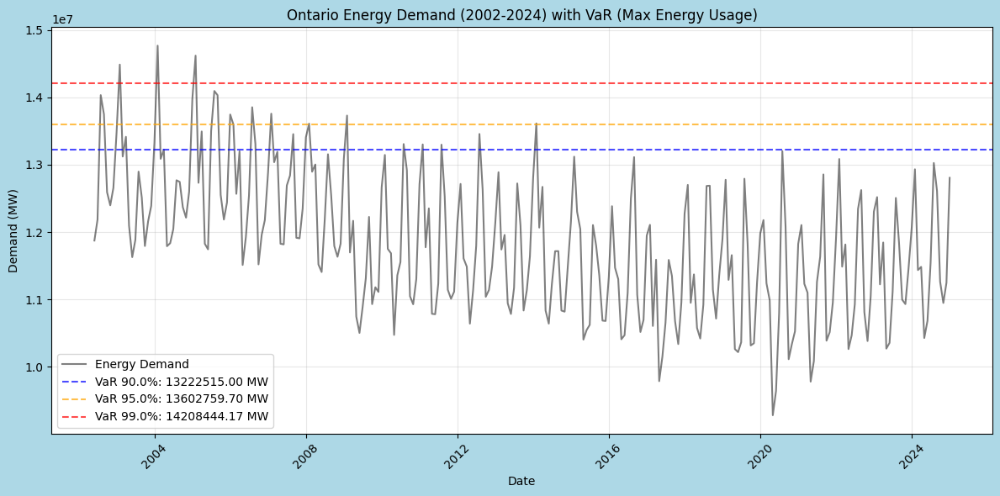

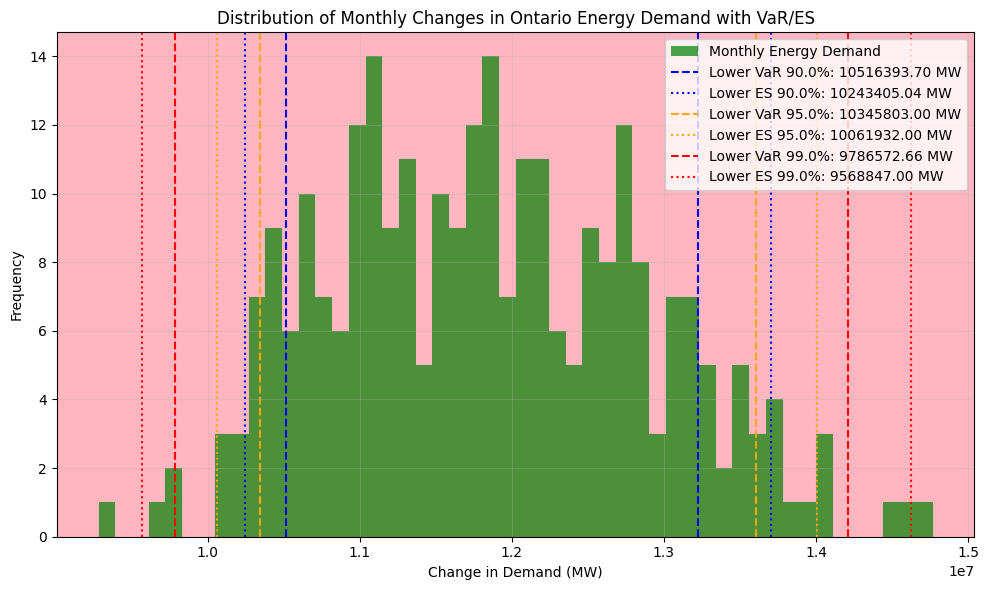

In [45]:
plt.figure(figsize=(12, 6), facecolor='lightblue')
plt.plot(monthly_tot.index, monthly_tot, label='Energy Demand', color='black', alpha=0.5)

# Add VaR lines for raw data (upper tail)
colors = {0.90: 'blue', 0.95: 'orange', 0.99: 'red'}
for cl, (var, es) in upper_tail_results.items():
    plt.axhline(y=var, color=colors[cl], linestyle='--', alpha=0.7,
                label=f'VaR {cl*100}%: {var:.2f} MW')

plt.title('Ontario Energy Demand (2002-2024) with VaR (Max Energy Usage)')
plt.xlabel('Date')
plt.ylabel('Demand (MW)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Histogram of Differenced Data with VaR/ES
plt.figure(figsize=(10, 6))
plt.hist(monthly_tot, bins=50, alpha=0.7, color='green', label='Monthly Energy Demand')
for cl, (var_lower, es_lower) in lower_tail_results.items():
    plt.axvline(var_lower, color=colors[cl], linestyle='--',
                label=f'Lower VaR {cl*100}%: {var_lower:.2f} MW')
    plt.axvline(es_lower, color=colors[cl], linestyle=':',
                label=f'Lower ES {cl*100}%: {es_lower:.2f} MW')
for cl, (var_upper, es_upper) in upper_tail_diff_results.items():
    plt.axvline(var_upper, color=colors[cl], linestyle='--')
    plt.axvline(es_upper, color=colors[cl], linestyle=':')

asx = plt.gca()
asx.set_facecolor('lightpink')
plt.title('Distribution of Monthly Changes in Ontario Energy Demand with VaR/ES')
plt.xlabel('Change in Demand (MW)')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [46]:
# Tail Risk Analyses (Extreme Value Theory (EVT) with Generalized Pareto Distribution (GPD))
# Fit GPD to upper tail of raw data
threshold = np.percentile(monthly_tot, 95)
exceedances = monthly_tot[monthly_tot > threshold] - threshold
gpd_params = genpareto.fit(exceedances)

# Estimate probability of extreme demand (e.g., > 99.9th percentile)
extreme_threshold = np.percentile(monthly_tot, 99.9)
prob_extreme = 1 - genpareto.cdf(extreme_threshold - threshold, *gpd_params)
print(f"Probability of Energy Demand exceeding {extreme_threshold:,.2f} MegaWatts in one month: {prob_extreme:.2%}")

# Hill Estimator for upper tail, the tail index measures the "heaviness" of the tails, indicating how extreme the outliers can be
k = 12*3  #  largest observations to use (assuming 3 years of the highest Peaks 12x3)
sorted_data = np.sort(monthly_tot)[::-1]  # Sort in descending order
hill_estimator = np.mean(np.log(sorted_data[:k] / sorted_data[k]))
print(f"Hill Estimator (Tail Index): {hill_estimator:.2%}")

Probability of Energy Demand exceeding 14,727,367.11 MegaWatts in one month: 3.10%
Hill Estimator (Tail Index): 3.65%


In [47]:
# Convert Original data by month equivalent and then apply month name season
df = pd.DataFrame()
df['month'] = monthly_tot.index.month
df['season'] = df['month'].map({12: 'Winter', 1: 'Winter', 2: 'Winter', 3: 'Spring', 4: 'Spring', 5: 'Spring', 6: 'Summer', 7: 'Summer', 8: 'Summer',
    9: 'Fall', 10: 'Fall', 11: 'Fall'})

df.index = monthly_tot.index
df['data']=monthly_tot

seasonal_tail_risk = {}
cl = 0.95  # 95% confidence level
for season, group in df.groupby('season'):
    var, es = calculate_var_es(group['data'], 1 - cl)
    seasonal_tail_risk[season] = (var, es)

table_Season = [['Season','Value-at-Risk 95% (MW)','Expected Shortfall 95% (MW)'],
['Winter', "{:,.2f}".format(seasonal_tail_risk['Winter'][0]),"{:,.2f}".format(seasonal_tail_risk['Winter'][1])],
['Spring', "{:,.2f}".format(seasonal_tail_risk['Spring'][0]),"{:,.2f}".format(seasonal_tail_risk['Spring'][1])],
['Summer', "{:,.2f}".format(seasonal_tail_risk['Summer'][0]),"{:,.2f}".format(seasonal_tail_risk['Summer'][1])],
['Fall', "{:,.2f}".format(seasonal_tail_risk['Fall'][0]),"{:,.2f}".format(seasonal_tail_risk['Fall'][1])]]

print(tabulate(table_Season, headers='firstrow', tablefmt='fancy_grid'))

╒══════════╤══════════════════════════╤═══════════════════════════════╕
│ Season   │ Value-at-Risk 95% (MW)   │ Expected Shortfall 95% (MW)   │
╞══════════╪══════════════════════════╪═══════════════════════════════╡
│ Winter   │ 13,914,733.90            │ 14,463,859.00                 │
├──────────┼──────────────────────────┼───────────────────────────────┤
│ Spring   │ 13,197,820.90            │ 13,333,351.00                 │
├──────────┼──────────────────────────┼───────────────────────────────┤
│ Summer   │ 13,811,729.20            │ 14,003,538.25                 │
├──────────┼──────────────────────────┼───────────────────────────────┤
│ Fall     │ 12,507,965.80            │ 12,600,679.25                 │
╘══════════╧══════════════════════════╧═══════════════════════════════╛


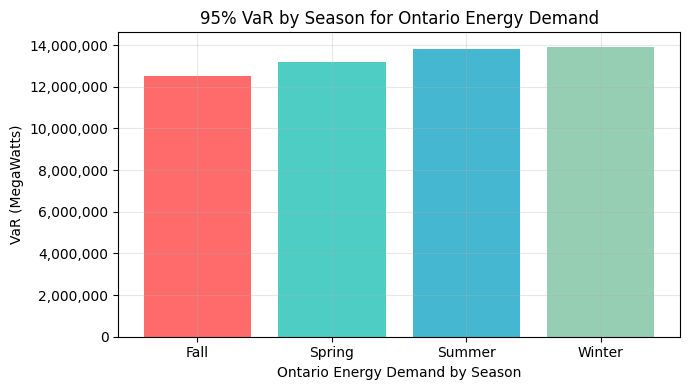

In [48]:
seasons = list(seasonal_tail_risk.keys())
vars = [seasonal_tail_risk[season][0] for season in seasons]

# Define a list of colors (one for each season)
colors = ['#FF6B6B', '#4ECDC4', '#45B7D1', '#96CEB4']

plt.figure(figsize=(7, 4))
plt.bar(seasons, vars, color=colors)
plt.title('95% VaR by Season for Ontario Energy Demand')
plt.xlabel('Ontario Energy Demand by Season')
plt.ylabel('VaR (MegaWatts)')
plt.grid(True, alpha=0.3)

# avoid scientific notation
plt.ticklabel_format(style='plain', axis='y')
# updating format for million
plt.gca().yaxis.set_major_formatter(ticker.StrMethodFormatter('{x:,.0f}'))
plt.tight_layout()
plt.show()

In [49]:
# Stress Testing
threshold = np.percentile(monthly_tot, 95)
print(f"Threshold (95th percentile): {threshold:,.2f} MW")

exceedances = monthly_tot[monthly_tot > threshold] - threshold
print(f"Number of exceedances: {len(exceedances)}")

gpd_params = genpareto.fit(exceedances)
shape, loc, scale = gpd_params

print(f"GPD Parameters:")
print(f" - Shape (ξ): {shape:.4f}")
print(f" - Location (μ): {loc:,.4f}")
print(f" - Scale (σ): {scale:,.4f}")

# Simulation a 1-in-100-year Month event
# Assuming 365 days and 12 Months per year, a 1-in-100-year event corresponds to a return period of (100 * 365) = 36,500 days and for Months = 3,041
total_days = len(monthly_tot)  # Number of observations (e.g., 1000 days in example)
return_period = int((100 * 365)/12)  # 1-in-100-year event
probability = 1 / return_period  # Probability of exceeding the threshold in a single day
quantile = genpareto.ppf(1 - probability, shape, loc=0, scale=scale)  # GPD quantile
one_in_100_year_value = threshold + quantile

print(f"Estimated 1-in-100-year Monthly Energy Demand spike: {one_in_100_year_value:,.2f} MegaWatts")

Threshold (95th percentile): 13,602,759.70 MW
Number of exceedances: 14
GPD Parameters:
 - Shape (ξ): -0.2797
 - Location (μ): 7,417.3000
 - Scale (σ): 502,762.4292
Estimated 1-in-100-year Monthly Energy Demand spike: 15,209,487.73 MegaWatts


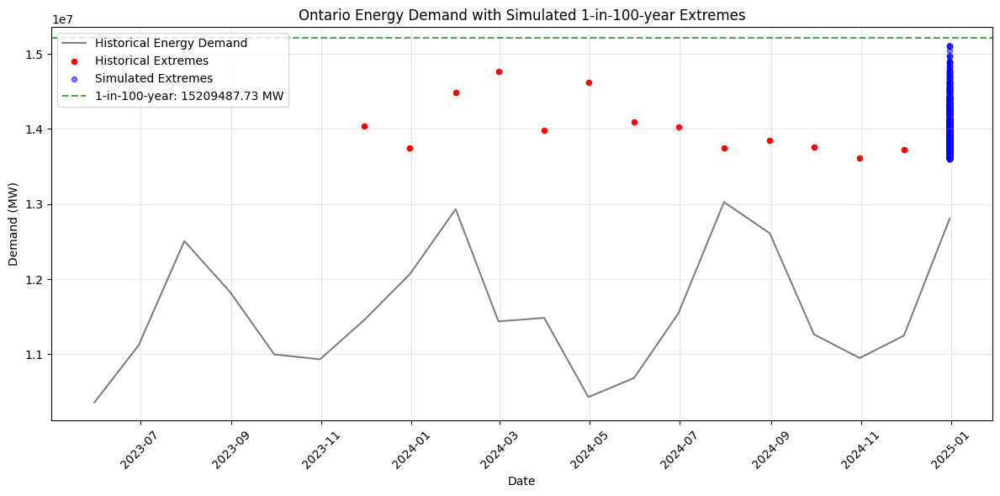

In [56]:
n_simulations = 1000  # Number of synthetic extreme values to generate
synthetic_exceedances = genpareto.rvs(shape, loc=0, scale=scale, size=n_simulations)
synthetic_extremes = threshold + synthetic_exceedances

plt.figure(figsize=(12, 6))
plt.plot(df.tail(20).index, df['data'].tail(20), label='Historical Energy Demand', color='black', alpha=0.5)
plt.scatter(df.tail(20).index[-len(exceedances):], df['data'][df['data'] > threshold],
            color='red', label='Historical Extremes', s=20)
plt.scatter(np.tile(df.index[-1], n_simulations), synthetic_extremes,
            color='blue', label='Simulated Extremes', alpha=0.5, s=20)
plt.axhline(y=one_in_100_year_value, color='green', linestyle='--',
            label=f'1-in-100-year: {one_in_100_year_value:.2f} MW', alpha=0.7)
plt.title('Ontario Energy Demand with Simulated 1-in-100-year Extremes')
plt.xlabel('Date')
plt.ylabel('Demand (MW)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

In [38]:
var_95 = upper_tail_results[0.95][0]
print(f"95% VaR (historical): {var_95:,.2f} MW")
print(f"1-in-100-year value exceeds 95% VaR by: {one_in_100_year_value - var_95:,.2f} MW")

95% VaR (historical): 13,602,759.70 MW
1-in-100-year value exceeds 95% VaR by: 1,606,728.03 MW
